In [390]:
%run "../Retropy_framework.ipynb"

In [391]:
all_assets = [
# ==== STOCKS ====
# Global
d_ac,
# US
ac,
lc,
mc,
sc,
mcc,
lcv,
mcv,
scv,
lcg,
mcg,
scg,
# ex-US
i_ac,
i_sc,
i_dev,
i_acv,
i_scv,
em_ac,
em_sc,
fr_ac,

# ==== BONDS ====
# US GOVT
sgb,
tips,
lgb,
elgb,
gb,
fgb,
# US CORP 
cb,
scb,
lcb,
fcb,
# US CORP+GOVT
gcb,
sgcb,
# International
i_tips,
i_gcbUsd,
i_gbLcl,
i_gb,
i_cb,
i_cjb,
g_gcbLcl,
g_gcbUsd,
g_sgcb,
g_usgcb,
em_gbUsd,
emb,
em_gbLcl,
em_cjb,
cjb,
junk,
scjb,

# ==== CASH ====
rfr,

# ==== OTHER ====
#fedRate,
reit,
i_reit,
gold,
silver,
palladium,
platinum,
#metals,
comm,
oilWtiQ,
oilBrentQ,

]

In [392]:
#conf_cache_disk = False
#conf_cache_memory = False
conf_cache_fails = False
all_assets = get(all_assets, source="AV")

In [346]:
all = filterByStart(all_assets, 2008)
#show(all, legend=False)

dropped: i_cjb, scb, i_tips, g_usgcb, fgb, em_cjb, lcb, fcb, g_sgcb, scjb, fr_ac, em_sc


dropped: i_cjb, scb, i_tips, g_usgcb, fgb, em_cjb, lcb, fcb, g_sgcb, scjb, fr_ac, em_sc
trimmed data from 1968-01-02 [gold, silver] to 2007-01-11 [rfr]


<Figure size 864x576 with 0 Axes>

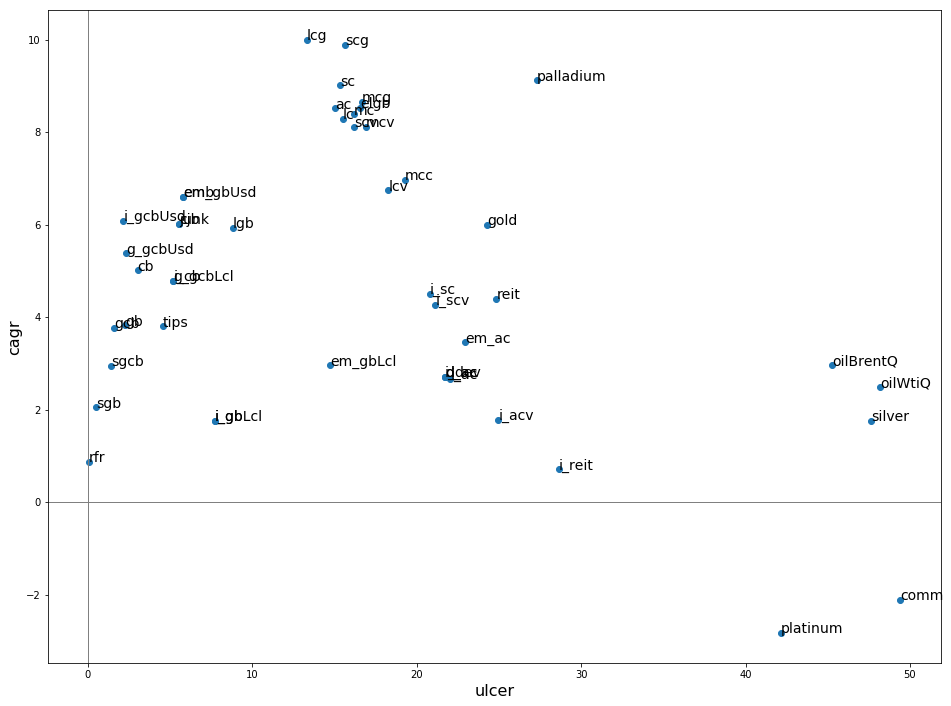

In [144]:
all = filterByStart(all_assets, 2008)
all = doTrim(all)
showRiskReturn(*all)

In [145]:
# PERM, BRK-B, GURU, ...
ser = lrret(PERM, all, fit_values=True, sum1=True, pos_weights=True, freq="M")
#ser[ser>0.01].sort_values(ascending=False)
ser[np.abs(ser)>0.01].sort_values(ascending=False)
show(rfr)

trimmed data from 2012-02-29 [PERM, PERM - fit] to 2012-02-29 [PERM, PERM - fit]


R^2: 0.9676794382588699


gold       0.1994
g_gcbUsd   0.1563
rfr        0.1319
sgb        0.1002
lgb        0.0882
em_ac      0.0852
elgb       0.0496
i_gcbUsd   0.0440
gb         0.0436
silver     0.0328
scg        0.0238
lc         0.0151
reit       0.0146
dtype: float64

trimmed data from 2007-01-11 [rfr] to 2007-01-11 [rfr]


trimmed data from 1968-01-02 [gold, silver] to 2016-01-04 [em_cjb]
i_cjb:83.1    R^2: 0.757   start:2016-01-04 00:00:00
i_cjb:47.2|cjb:45.0    R^2: 0.812   start:2016-01-04 00:00:00
cjb:63.7|i_sc:12.5|i_cjb:8.9    R^2: 0.878   start:2016-01-04 00:00:00
cjb:65.3|gcb:18.9|i_sc:14.6|i_cjb:1.2    R^2: 0.894   start:2016-01-04 00:00:00
cjb:54.2|gcb:21.1|i_sc:15.2|emb:9.4|i_cjb:0.0    R^2: 0.900   start:2016-01-04 00:00:00
cjb:41.7|g_gcbUsd:25.6|i_sc:14.2|emb:12.4|gcb:6.1|i_cjb:0.0    R^2: 0.904   start:2016-01-04 00:00:00


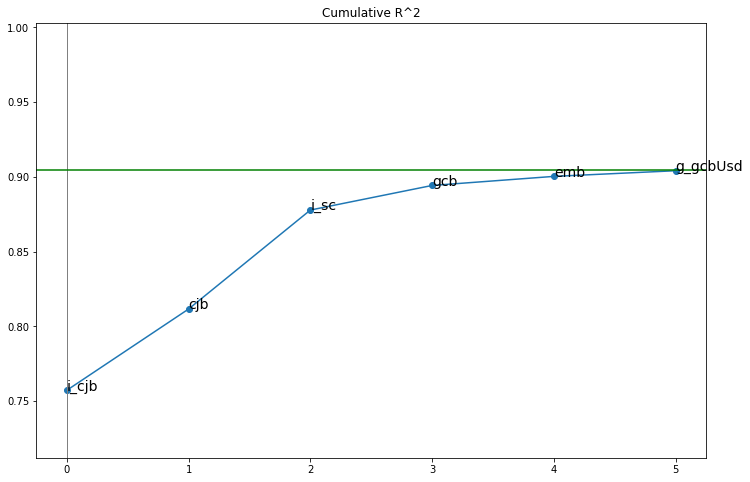

i_cjb      0.7572
cjb        0.8116
i_sc       0.8778
gcb        0.8942
emb        0.9003
g_gcbUsd   0.9041
dtype: float64

In [406]:
conf_cache_fails=False
all = filterByStart(all_assets)
lrret_incremental("FPE", all, max_n=6)

trimmed data from 2016-01-04 [FPE, FPE - fit] to 2016-01-04 [FPE, FPE - fit]


R^2: 0.9041067710930791


cjb        0.4166
g_gcbUsd   0.2559
i_sc       0.1421
emb        0.1244
gcb        0.0610
i_cjb      0.0000
dtype: float64

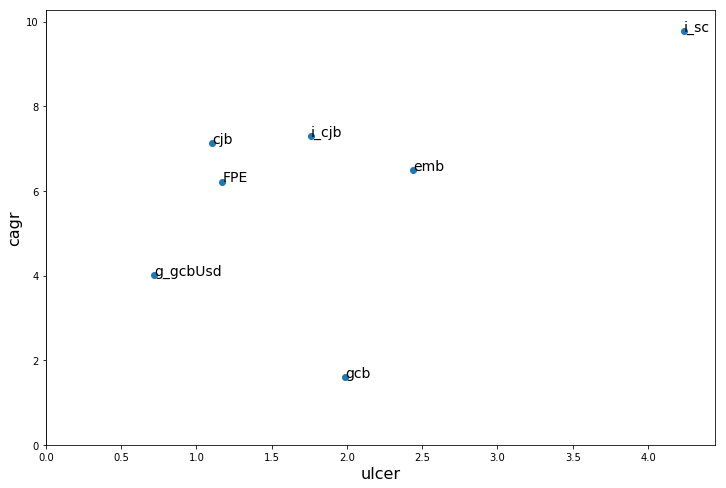

In [425]:
target = FPE
sources = get([i_cjb, cjb, i_sc, gcb, emb, g_gcbUsd])
sources = trimBy(sources, [get(em_cjb)])
target = trimBy([target], [get(em_cjb)])[0]

lrret(target, sources)
show(target, sources, trim=False)
showRiskReturn(target, *sources)
#showRiskReturn(target, *sources, ret_func=get_curr_yield)

In [264]:
def lrret_mutual_cross(sources, show=True, **lrret_args):
    sources = get(sources)
    res = []
    for target in sources:
        rest = sources.copy()
        rest.remove(target)
        rs = lrret(target, rest, return_res=True, return_ser=False, show_res=False, **lrret_args)
        res.append((rs['R^2'], target.name))
        port = dict_to_port_name((rs["ser"]*100).to_dict(), drop_zero=True)
        print(f"{target.name}: {port}   R^2: {rs['R^2']:.3f}")
        

    res = pd.Series(*list(zip(*res))).fillna(method='bfill')
    res = res.sort_values()
    if show:
        show_series(res, figure=False)
        #plt.axhline(, c="blue");
        plt.axhline(1/math.e, c="orange");        
        plt.axhline(math.exp(0.9)/math.e, c="green");        
        plt.ylim(ymax=1.003)
        plt.title("mutual R^2")
        #plt.show()
            
    return res

def lrret_mutual_incremental(sources, base=None, show=True, max_n=None, **lrret_args):
    if base is None:
        base = lc
    base = get(base)
    cum_sources = [base]
    sources = get(sources)
    sources = sources.copy()
    top = []
    while len(sources) > 0:
        if max_n and len(top) == max_n:
            break
        allres = [lrret(target, cum_sources, return_res=True, return_ser=False, show_res=False, **lrret_args) for target in sources]
        max_i = np.argmin([res["R^2"] for res in allres])
        max_res = allres[max_i]
        max_source = sources[max_i]

        top.append((max_res["R^2"], max_source.name))
        cum_sources.append(max_source)
        del sources[max_i]
        
        port = dict_to_port_name((max_res["ser"]*100).to_dict(), drop_zero=True)
        print(f"{max_source.name}: {port}   R^2: {max_res['R^2']:.3f}")
        
        if len(top) == 1:
            cum_sources.remove(base) # we only need the base for the first one
        

    res = pd.Series(*list(zip(*top))).fillna(method='bfill')
    if show:
        #clear_output()
        #plt.figure()
        show_series(res, figure=False)
        #plt.axhline(, c="blue");
        plt.axhline(1/math.e, c="orange");        
        plt.axhline(math.exp(0.9)/math.e, c="green");        
        plt.ylim(ymax=1.003)        
        plt.title("incremental R^2 (S&P500 seed)")
        plt.show()
            
    return res
           
def lrret_mutual(sources, base=None, show=True, max_n=None, **lrret_args):
    print()
    print("Cross:")
    res_cross = lrret_mutual_cross(sources, show=False)
    print()
    print("Incremental:")
    res_inc = lrret_mutual_incremental(sources, show=False)    
    if show:
        #plt.figure()
        show_series(res_cross, figure=True, label="Cross")
        #plt.gca().lines[-1].set_label("cross")
        show_series(res_inc, figure=False, label="Incremental")
        #plt.gca().lines[-1].set_label("inc")
        plt.axhline(1/math.e, c="orange");        
        plt.axhline(math.exp(0.9)/math.e, c="green");        
        plt.ylim(ymax=1.003)        
        plt.title("R^2")
        plt.legend()
        plt.show()
    

trimmed data from 1999-03-10 [QQQ] to 2015-03-24 [XT]

Cross:
XT: QQQ:61.9|KWEB:18.8|IBB:4.6|ARKW:3.0   R^2: 0.917
KWEB: XT:64.3|ARKW:35.7   R^2: 0.774
QQQ: XT:49.1|FDN:41.5   R^2: 0.966
FDN: QQQ:65.0|ARKW:35.0   R^2: 0.878
IBB: KWEB:13.4   R^2: 0.419
ARKW: FDN:96.1|KWEB:3.9   R^2: 0.371

Incremental:
ARKW: lc:100.0   R^2: 0.047
IBB: ARKW:8.4   R^2: 0.411
KWEB: ARKW:65.5|IBB:10.4   R^2: 0.721
FDN: ARKW:68.5   R^2: 0.838
XT: ARKW:34.4|KWEB:19.6   R^2: 0.882
QQQ: XT:49.1|FDN:41.5   R^2: 0.966


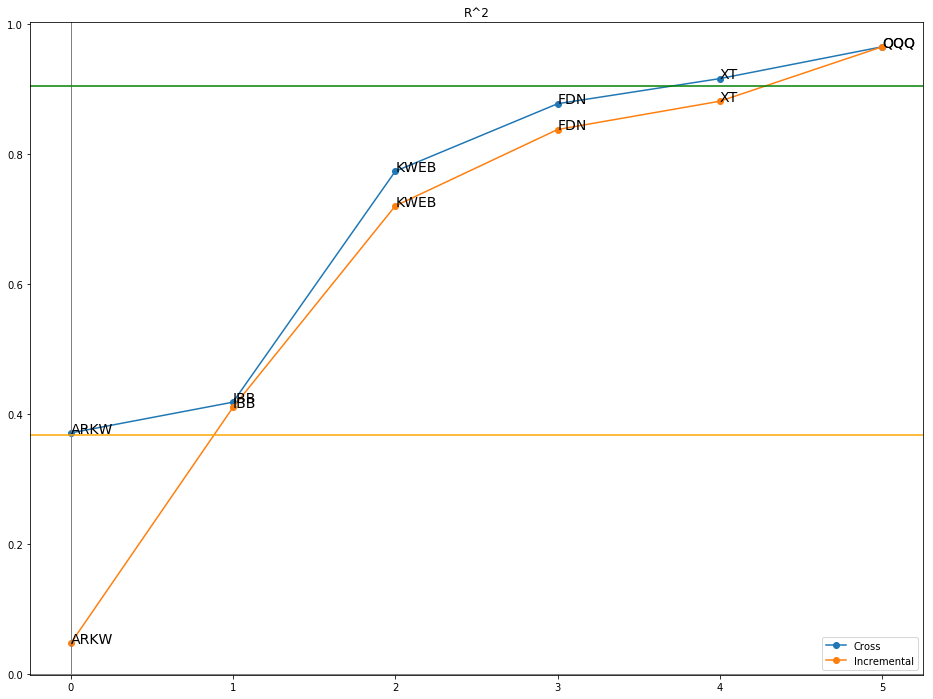

In [325]:
#all = get([FPE, ANGL, EMB, EBND, gb, cb, lc, i_ac, VWO, VBR, FDN, QQQ, IBB, EDV, usdMajor], trim=True)
all = get([XT, KWEB, QQQ, FDN, IBB, ARKW], trim=True)
#all = [ac, sc, lc, i_ac, em_ac, gb, cb, gold]
#lrret_mutual_dependence([FDN, QQQ, IBB, 'XBI', VGT])

lrret_mutual(all)

In [323]:
lrret(lc, lc)

lrret: 1st attempt failed with: Inequality constraints incompatible
lrret: 2nd attempt failed with: Inequality constraints incompatible
lrret: 2nd attempt (random) was better, 1st:1.0, 2nd: 0.9999999999999982
trimmed data from 1980-01-02 [lc, lc - fit] to 1980-01-02 [lc, lc - fit]


R^2: 0.9999999999999982


lc   1.0000
dtype: float64


Cross:
lc: sc:100.0   R^2: 0.059
sc: lc:71.0   R^2: 0.664

Incremental:
lrret: 1st attempt failed with: Inequality constraints incompatible
lrret: 2nd attempt (random) was better, 1st:1.0, 2nd: 0.999999994208449
sc: lc:71.0   R^2: 0.664
lc: sc:100.0   R^2: 0.059


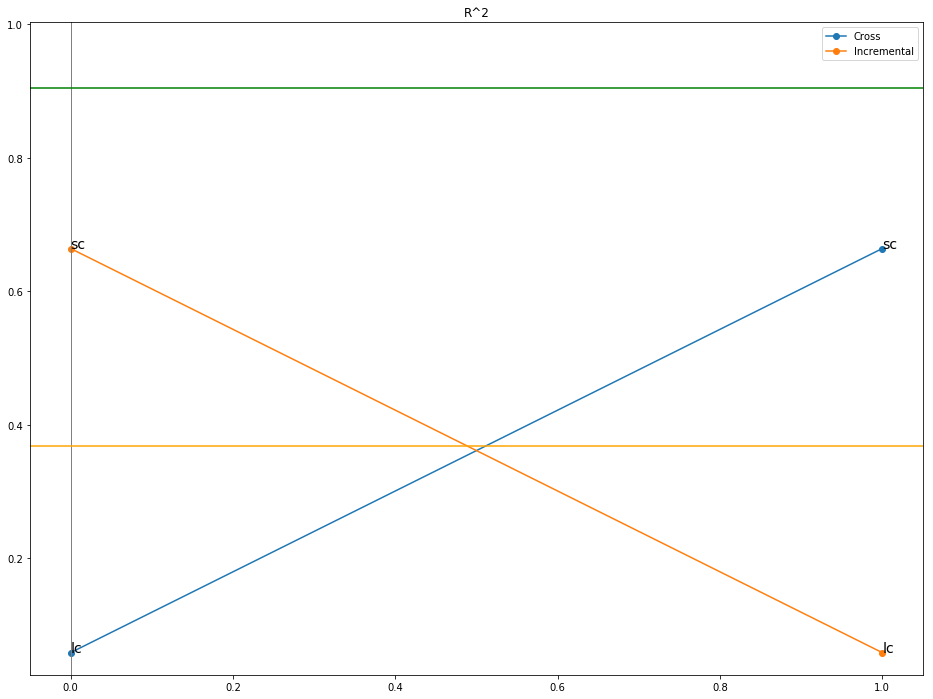

In [317]:
lrret_mutual([lc, sc])

In [318]:
lrret(QQQ, [XT, KWEB, FDN, IBB, ARKW])

trimmed data from 2015-03-24 [QQQ, QQQ - fit] to 2015-03-24 [QQQ, QQQ - fit]


R^2: 0.9656511111536354


XT     0.4913
FDN    0.4153
KWEB   0.0000
IBB    0.0000
ARKW   0.0000
dtype: float64

In [148]:
show([x/QQQ for x in all])

trimmed data from 2015-03-24 [XT / QQQ, KWEB / QQQ, QQQ / QQQ, FDN / QQQ, IBB / QQQ, ARKW / QQQ] to 2015-03-24 [XT / QQQ, KWEB / QQQ, QQQ / QQQ, FDN / QQQ, IBB / QQQ, ARKW / QQQ]


reit: i_reit:113.9|usdMajor:-13.9
i_reit: reit:54.6|usdMajor:-40.0
usdMajor: reit:33.0|i_reit:-29.0


reit       0.2111
usdMajor   0.3733
i_reit     0.7485
dtype: float64

reit: lc:100.0   R^2: 0.158
usdMajor:    R^2: 0.290
i_reit: reit:46.4   R^2: 0.723


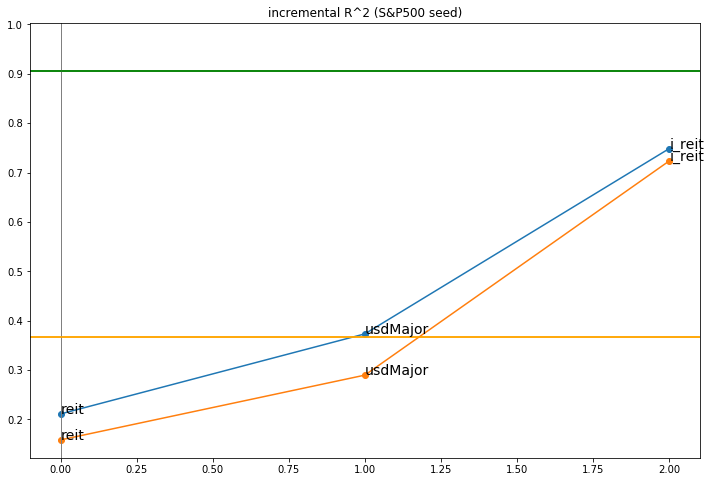

reit       0.1585
usdMajor   0.2898
i_reit     0.7235
dtype: float64

In [319]:
all = [reit, i_reit, usdMajor]
lrret_mutual_dependence(all, sum1=False, pos_weights=False)
lrret_mutual_incremental(all)


In [344]:
lrret(FPE, [gb, QQQ, EBND, EDV, IBB])

trimmed data from 2013-02-12 [FPE, FPE - fit] to 2013-02-12 [FPE, FPE - fit]


R^2: 0.4321671837121392


gb     0.4261
QQQ    0.2840
EBND   0.1663
EDV    0.1237
IBB    0.0000
dtype: float64

In [345]:
lrret(QQQ, [FDN, IBB, 'XBI', 'VGT'])

trimmed data from 2006-06-23 [QQQ, QQQ - fit] to 2006-06-23 [QQQ, QQQ - fit]


R^2: 0.9887379946668157


VGT   0.5715
FDN   0.2598
IBB   0.1687
XBI   0.0000
dtype: float64

In [341]:
lrret("PERM", get([i_cb, lcv, gold, gcb], source="AV"))

trimmed data from 2012-02-08 [PERM, PERM - fit] to 2012-02-08 [PERM, PERM - fit]


R^2: 0.9205576883153522


gcb    0.5963
gold   0.2951
lcv    0.1086
i_cb   0.0000
dtype: float64

In [46]:
show_rolling_beta("PERM", get([i_cb, lcv, gold, gcb], source="AV"), freq="M")

In [340]:
# we can see how HTUS changse SPY exposure dynamically
show_rolling_beta("HTUS", [SPY], window=14, rsq=False, extra=((HTUS/SPY)-0.11)*40)

In [331]:
target = 'AAPL:20|GOOG:20|AMZN:20|MSFT:20|FB:20'
assets = [FDN, QQQ, SPY, VGT, IEI, GLD, VEA, VWO]

lrret(target, assets)

trimmed data from 2014-03-28 [AAPL:20|GOOG:20|AMZN:20|MSFT:20|FB:20, AAPL:20|GOOG:20|AMZN:20|MSFT:20|FB:20 - fit] to 2014-03-28 [AAPL:20|GOOG:20|AMZN:20|MSFT:20|FB:20, AAPL:20|GOOG:20|AMZN:20|MSFT:20|FB:20 - fit]


R^2: 0.17123798419993919


FDN   1.0000
VWO   0.0000
VGT   0.0000
VEA   0.0000
SPY   0.0000
QQQ   0.0000
IEI   0.0000
GLD   0.0000
dtype: float64

In [330]:
# one fits the other better, as it can under-leverage, while the other is not allowed to over-leverage
lrret(MINT, NEAR)
lrret(NEAR, MINT)

trimmed data from 2016-01-04 [MINT, MINT - fit] to 2016-01-04 [MINT, MINT - fit]


R^2: 0.0006043398005719973


NEAR   1.0000
dtype: float64

trimmed data from 2016-01-04 [NEAR, NEAR - fit] to 2016-01-04 [NEAR, NEAR - fit]


R^2: 0.12983107727738397


MINT   0.7911
dtype: float64

## Edge cases

In [329]:
lrret(sc, lc, sum_max1=True) # this wasn't working well until we switched to log() objective function

trimmed data from 1980-01-02 [sc, sc - fit] to 1980-01-02 [sc, sc - fit]


R^2: 0.6642829175094838


lc   0.7103
dtype: float64